In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600

sns.set_theme(style='darkgrid', palette='viridis', rc={
              "figure.dpi": 600, 'savefig.dpi': 600, 'figure.figsize': (11.7, 8.27)})

In [2]:
df = pd.read_csv('../assets/fire_info.csv')

In [3]:
df.head()

,_uid_,id,initialdat,finaldate,area_ha,0,longitude,latitude
0,4355.0,6508161.0,2006-06-01,2006-06-01,42.970469,1,-2.058915e+06,2.075576e+06
1,4356.0,6508163.0,2006-06-01,2006-06-01,21.480318,1,-2.167082e+06,1.988491e+06
2,4357.0,6508166.0,2006-06-08,2006-06-10,150.349684,1,-1.646545e+06,1.820475e+06
3,4358.0,6508178.0,2006-06-07,2006-06-09,64.421209,1,-1.946413e+06,1.775587e+06
4,4359.0,6508187.0,2006-06-12,2006-06-13,558.194703,1,-1.915160e+06,1.658686e+06


In [4]:
# Replacing counting # of days from initialdat to finaldate

df['initialdate'] = pd.to_datetime(df['initialdat'])
df['finaldate'] = pd.to_datetime(df['finaldate'])

df['days'] = (df['finaldate'] - df['initialdate']).dt.days
df.head()

,_uid_,id,initialdat,finaldate,area_ha,0,longitude,latitude,initialdate,days
0,4355.0,6508161.0,2006-06-01,2006-06-01,42.970469,1,-2.058915e+06,2.075576e+06,2006-06-01,0
1,4356.0,6508163.0,2006-06-01,2006-06-01,21.480318,1,-2.167082e+06,1.988491e+06,2006-06-01,0
2,4357.0,6508166.0,2006-06-08,2006-06-10,150.349684,1,-1.646545e+06,1.820475e+06,2006-06-08,2
3,4358.0,6508178.0,2006-06-07,2006-06-09,64.421209,1,-1.946413e+06,1.775587e+06,2006-06-07,2
4,4359.0,6508187.0,2006-06-12,2006-06-13,558.194703,1,-1.915160e+06,1.658686e+06,2006-06-12,1


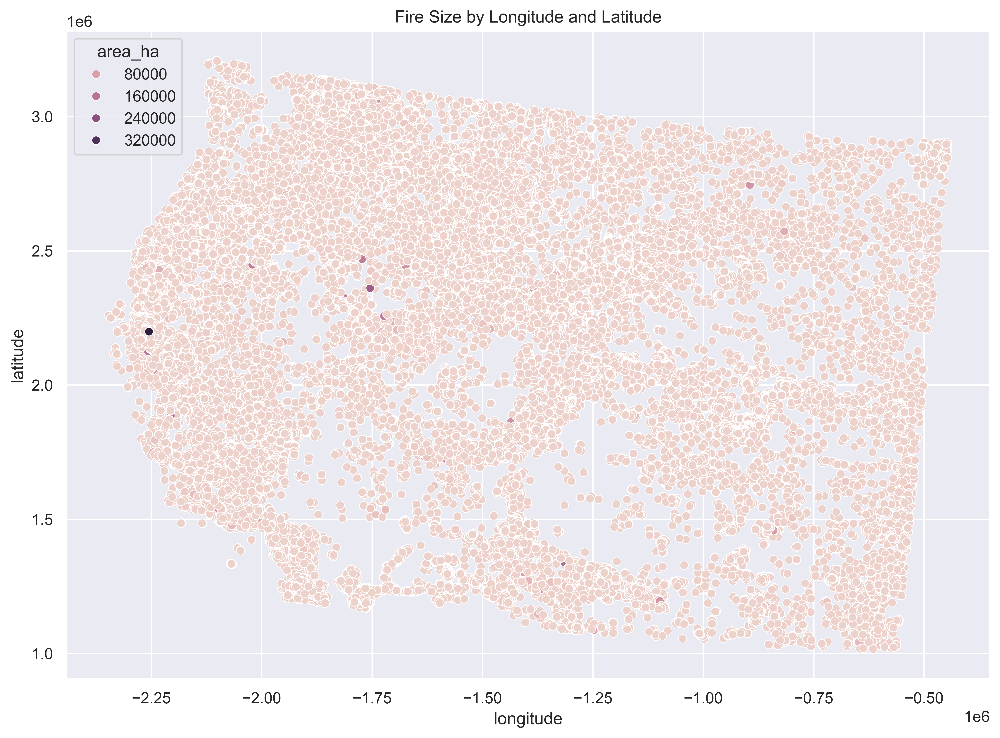

In [5]:
# Plotting longitude and latitude using seaborn

sns.scatterplot(data=df, x='longitude', y='latitude', hue='area_ha')
plt.title('Fire Size by Longitude and Latitude')
plt.show()

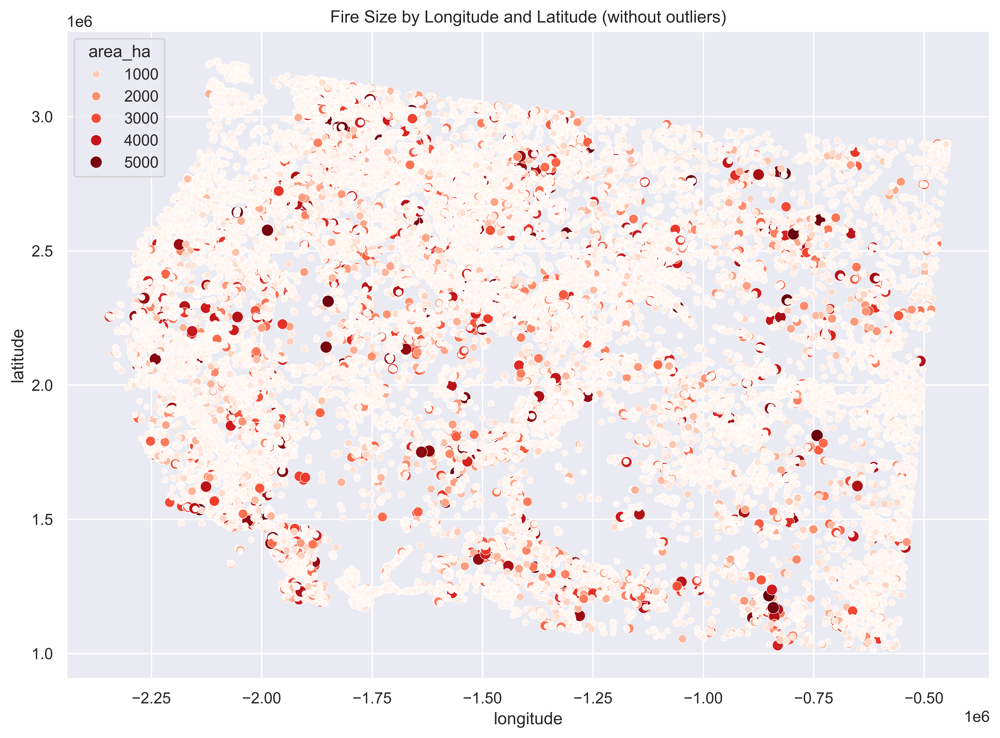

In [6]:
# Making a temporary dataframe without outliers in area_ha by using z-score

df['zscore'] = (df['area_ha'] - df['area_ha'].mean()) / df['area_ha'].std()
temp_df = df[df['zscore'].abs() < 1]

sns.scatterplot(data=temp_df, x='longitude', y='latitude',
                hue='area_ha', size='area_ha', palette='Reds')
plt.title('Fire Size by Longitude and Latitude (without outliers)')
plt.show()

In [7]:
df.head()

,_uid_,id,initialdat,finaldate,area_ha,0,longitude,latitude,initialdate,days,zscore
0,4355.0,6508161.0,2006-06-01,2006-06-01,42.970469,1,-2.058915e+06,2.075576e+06,2006-06-01,0,-0.102467
1,4356.0,6508163.0,2006-06-01,2006-06-01,21.480318,1,-2.167082e+06,1.988491e+06,2006-06-01,0,-0.107067
2,4357.0,6508166.0,2006-06-08,2006-06-10,150.349684,1,-1.646545e+06,1.820475e+06,2006-06-08,2,-0.079479
3,4358.0,6508178.0,2006-06-07,2006-06-09,64.421209,1,-1.946413e+06,1.775587e+06,2006-06-07,2,-0.097875
4,4359.0,6508187.0,2006-06-12,2006-06-13,558.194703,1,-1.915160e+06,1.658686e+06,2006-06-12,1,0.007830


In [8]:
df['zscore'].describe()

count    6.071500e+04
mean     9.362335e-19
std      1.000000e+00
min     -1.070735e-01
25%     -1.070602e-01
50%     -1.024565e-01
75%     -8.407999e-02
max      7.936841e+01
Name: zscore, dtype: float64

In [9]:
df.drop(columns=['initialdat', '0', 'finaldate'], inplace=True)
df.head()

,_uid_,id,area_ha,longitude,latitude,initialdate,days,zscore
0,4355.0,6508161.0,42.970469,-2.058915e+06,2.075576e+06,2006-06-01,0,-0.102467
1,4356.0,6508163.0,21.480318,-2.167082e+06,1.988491e+06,2006-06-01,0,-0.107067
2,4357.0,6508166.0,150.349684,-1.646545e+06,1.820475e+06,2006-06-08,2,-0.079479
3,4358.0,6508178.0,64.421209,-1.946413e+06,1.775587e+06,2006-06-07,2,-0.097875
4,4359.0,6508187.0,558.194703,-1.915160e+06,1.658686e+06,2006-06-12,1,0.007830


In [10]:
df['area_ha'].describe()

count     60715.000000
mean        521.619493
std        4671.268976
min          21.450500
25%          21.512278
50%          43.017498
75%         128.859225
max      371272.803452
Name: area_ha, dtype: float64

In [11]:
df.drop(columns=['zscore', 'area_ha'], inplace=True)

In [12]:
import os
import netCDF4 as nc
import numpy as np
import pandas as pd
from datetime import datetime


def find_narr_data(date, x_coord_meters, y_coord_meters, root="/media/bharxhav/valhalla/NARR"):
    """
    Find the NARR data for a specific date and x/y coordinate in meters.
    """
    variables = os.listdir(root)
    data = {}

    year = date.year
    month = date.strftime('%m')

    for var in variables:
        nc_file_path = f"{root}/{var}/{var}.{year}{month}.nc"
        if not os.path.exists(nc_file_path):
            print(f"File {nc_file_path} does not exist: Skipping")
            continue

        ds = nc.Dataset(nc_file_path, 'r')

        times = ds.variables['time'][:]

        time_units = ds.variables['time'].units
        time_calendar = getattr(ds.variables['time'], 'calendar', 'standard')
        dates = nc.num2date(times, units=time_units, calendar=time_calendar)

        time_diffs = np.abs(
            np.array([(dt - date).total_seconds() for dt in dates]))
        time_idx = np.argmin(time_diffs)

        if time_diffs[time_idx] > (12 * 3600):
            print(f"No time close to {date} in {nc_file_path}")
            ds.close()
            continue

        x = ds.variables['x'][:]
        y = ds.variables['y'][:]

        x_units = ds.variables['x'].units.lower()
        y_units = ds.variables['y'].units.lower()
        if 'km' in x_units:
            x_coord = x_coord_meters / 1000.0
        elif 'm' in x_units:
            x_coord = x_coord_meters
        else:
            raise ValueError(f"Unknown units for x: {x_units}")
        if 'km' in y_units:
            y_coord = y_coord_meters / 1000.0
        elif 'm' in y_units:
            y_coord = y_coord_meters
        else:
            raise ValueError(f"Unknown units for y: {y_units}")

        x_idx = np.argmin(np.abs(x - x_coord))
        y_idx = np.argmin(np.abs(y - y_coord))

        var_data = ds.variables[var]
        dims = var_data.dimensions

        if 'level' in dims:

            level_idx = 0
            data_value = var_data[time_idx, level_idx, y_idx, x_idx]
        elif 'time' in dims and 'y' in dims and 'x' in dims:
            data_value = var_data[time_idx, y_idx, x_idx]
        else:
            data_value = var_data[y_idx, x_idx]

        data[var] = data_value.item()
        ds.close()

    return data

In [13]:
df_head = df.head()

In [ ]:
def process_row(row):
    date = pd.to_datetime(row['initialdate'])
    x_coord_meters = row['longitude']
    y_coord_meters = row['latitude']
    data = find_narr_data(date, x_coord_meters, y_coord_meters)
    return pd.Series(data)


df_new_vars = df_head.apply(process_row, axis=1)


df_combined = pd.concat([df_head, df_new_vars], axis=1)

df_combined.head()

,_uid_,id,longitude,latitude,initialdate,days,air,hgt,omega,shum,tke,uwnd,vwnd
0,4355.0,6508161.0,-2.058915e+06,2.075576e+06,2006-06-01,0,296.880859,142.764740,0.094989,0.015673,0.500,-8.244415,-4.299395
1,4356.0,6508163.0,-2.167082e+06,1.988491e+06,2006-06-01,0,296.974609,141.264740,0.005145,0.016163,0.450,-8.650665,-4.127520
2,4357.0,6508166.0,-1.646545e+06,1.820475e+06,2006-06-08,2,296.648926,126.344711,-0.080519,0.015084,0.625,-7.824783,-2.584183
3,4358.0,6508178.0,-1.946413e+06,1.775587e+06,2006-06-07,2,296.580566,107.492142,-0.120584,0.014595,0.600,-6.927002,-2.009782
4,4359.0,6508187.0,-1.915160e+06,1.658686e+06,2006-06-12,1,297.667969,108.327118,0.060201,0.016113,0.500,-7.930750,-3.606476


In [ ]:
import os
import netCDF4 as nc
import numpy as np
import pandas as pd


def find_narr_data_batch(df, root="/media/bharxhav/valhalla/NARR/"):

    df['initialdate'] = pd.to_datetime(df['initialdate'])
    df['year'] = df['initialdate'].dt.year
    df['month'] = df['initialdate'].dt.month

    variables = os.listdir(root)
    all_results = []

    grouped = df.groupby(['year', 'month'])

    for (year, month), group in grouped:
        print(f"Processing data for Year: {year}, Month: {month}")
        group_results = pd.DataFrame(index=group.index)

        var_data_dict = {}

        for var in variables:
            nc_file_path = f"{root}/{var}/{var}_{year}{str(month).zfill(2)}.nc"
            if not os.path.exists(nc_file_path):
                print(
                    f"File {nc_file_path} does not exist. Skipping variable {var}.")
                continue

            print(f"Opening netCDF file for variable {var}: {nc_file_path}")
            ds = nc.Dataset(nc_file_path, 'r')

            times = ds.variables['time'][:]

            time_units = ds.variables['time'].units
            time_calendar = getattr(
                ds.variables['time'], 'calendar', 'standard')
            dates_nc = nc.num2date(
                times, units=time_units, calendar=time_calendar)

            date_to_time_idx = {}
            for idx_time, dt in enumerate(dates_nc):
                date_to_time_idx[dt] = idx_time

            date_indices = {}
            for date in group['initialdate'].unique():

                time_diffs = np.abs([(dt - date).total_seconds()
                                    for dt in dates_nc])
                time_idx = np.argmin(time_diffs)

                if time_diffs[time_idx] > (12 * 3600):
                    print(f"No time close to {date} in {nc_file_path}")
                    continue
                date_indices[date] = time_idx

            x = ds.variables['x'][:]
            y = ds.variables['y'][:]

            x_coord_to_idx = {}
            for x_coord in group['longitude'].unique():
                x_idx = np.argmin(np.abs(x - x_coord))
                x_coord_to_idx[x_coord] = x_idx

            y_coord_to_idx = {}
            for y_coord in group['latitude'].unique():
                y_idx = np.argmin(np.abs(y - y_coord))
                y_coord_to_idx[y_coord] = y_idx

            var_data = ds.variables[var]
            dims = var_data.dimensions

            if 'level' in dims:

                levels = ds.variables['level'][:]

                for idx, row in group.iterrows():
                    date = row['initialdate']
                    x_coord = row['longitude']
                    y_coord = row['latitude']

                    if date not in date_indices:
                        for level_idx, level_value in enumerate(levels):
                            col_name = f"{var}_level_{int(level_value)}"
                            group_results.at[idx, col_name] = np.nan
                        continue
                    time_idx = date_indices[date]
                    x_idx = x_coord_to_idx[x_coord]
                    y_idx = y_coord_to_idx[y_coord]

                    try:

                        data_values = var_data[time_idx, :, y_idx, x_idx]
                        for level_idx, level_value in enumerate(levels):
                            data_value = data_values[level_idx]
                            col_name = f"{var}_level_{int(level_value)}"
                            group_results.at[idx, col_name] = data_value.item()
                    except IndexError as e:
                        print(
                            f"IndexError for variable {var} at idx {idx}: {e}")
                        for level_idx, level_value in enumerate(levels):
                            col_name = f"{var}_level_{int(level_value)}"
                            group_results.at[idx, col_name] = np.nan
            elif 'time' in dims and 'y' in dims and 'x' in dims:

                for idx, row in group.iterrows():
                    date = row['initialdate']
                    x_coord = row['longitude']
                    y_coord = row['latitude']

                    if date not in date_indices:
                        group_results.at[idx, var] = np.nan
                        continue
                    time_idx = date_indices[date]
                    x_idx = x_coord_to_idx[x_coord]
                    y_idx = y_coord_to_idx[y_coord]

                    try:
                        data_value = var_data[time_idx, y_idx, x_idx]
                        group_results.at[idx, var] = data_value.item()
                    except IndexError as e:
                        print(
                            f"IndexError for variable {var} at idx {idx}: {e}")
                        group_results.at[idx, var] = np.nan
            else:

                print(f"Variable {var} has unexpected dimensions: {dims}")

                pass

            ds.close()

        all_results.append(group_results)

    data_df = pd.concat(all_results)

    df_combined = df.merge(data_df, left_index=True, right_index=True)
    return df_combined

In [22]:
find_narr_data_batch(df.head())

/tmp/ipykernel_49684/971268859.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['initialdate'] = pd.to_datetime(df['initialdate'])
/tmp/ipykernel_49684/971268859.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year'] = df['initialdate'].dt.year
/tmp/ipykernel_49684/971268859.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/

Processing data for Year: 2006, Month: 6
Opening netCDF file for variable air: /media/bharxhav/valhalla/NARR/air/air.200606.nc
Opening netCDF file for variable hgt: /media/bharxhav/valhalla/NARR/hgt/hgt.200606.nc
Opening netCDF file for variable omega: /media/bharxhav/valhalla/NARR/omega/omega.200606.nc
Opening netCDF file for variable shum: /media/bharxhav/valhalla/NARR/shum/shum.200606.nc
Opening netCDF file for variable tke: /media/bharxhav/valhalla/NARR/tke/tke.200606.nc
Opening netCDF file for variable uwnd: /media/bharxhav/valhalla/NARR/uwnd/uwnd.200606.nc


/tmp/ipykernel_49684/971268859.py:109: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  group_results.at[idx, col_name] = data_value.item()
/tmp/ipykernel_49684/971268859.py:109: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  group_results.at[idx, col_name] = data_value.item()
/tmp/ipykernel_49684/971268859.py:109: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To g

Opening netCDF file for variable vwnd: /media/bharxhav/valhalla/NARR/vwnd/vwnd.200606.nc


/tmp/ipykernel_49684/971268859.py:109: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  group_results.at[idx, col_name] = data_value.item()
/tmp/ipykernel_49684/971268859.py:109: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  group_results.at[idx, col_name] = data_value.item()
/tmp/ipykernel_49684/971268859.py:109: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To g

,_uid_,id,longitude,latitude,initialdate,days,year,month,air_level_1000,air_level_975,...,vwnd_level_350,vwnd_level_300,vwnd_level_275,vwnd_level_250,vwnd_level_225,vwnd_level_200,vwnd_level_175,vwnd_level_150,vwnd_level_125,vwnd_level_100
0,4355.0,6508161.0,-2.058915e+06,2.075576e+06,2006-06-01,0,2006,6,296.880859,294.863525,...,3.177246,3.859253,4.616867,8.711868,10.968063,10.575684,9.211823,6.778320,4.033432,1.192429
1,4356.0,6508163.0,-2.167082e+06,1.988491e+06,2006-06-01,0,2006,6,296.974609,295.019775,...,3.708496,6.124878,7.632492,9.836868,10.343063,10.247559,10.196198,9.184570,6.158432,2.004929
2,4357.0,6508166.0,-1.646545e+06,1.820475e+06,2006-06-08,2,2006,6,296.648926,294.545654,...,0.062897,-0.397278,5.863144,10.506744,11.004456,5.688095,-3.041962,-1.906311,8.629517,2.834868
3,4358.0,6508178.0,-1.946413e+06,1.775587e+06,2006-06-07,2,2006,6,296.580566,294.392334,...,-1.582993,0.299881,4.999603,9.705017,4.664871,1.636124,1.617706,4.743683,8.385361,4.604789
4,4359.0,6508187.0,-1.915160e+06,1.658686e+06,2006-06-12,1,2006,6,297.667969,295.606934,...,-5.889938,-5.255081,-6.731140,-9.038300,-10.231064,-10.826859,-6.962982,-1.775406,3.611252,3.343099


In [23]:
df.head()

,_uid_,id,longitude,latitude,initialdate,days
0,4355.0,6508161.0,-2.058915e+06,2.075576e+06,2006-06-01,0
1,4356.0,6508163.0,-2.167082e+06,1.988491e+06,2006-06-01,0
2,4357.0,6508166.0,-1.646545e+06,1.820475e+06,2006-06-08,2
3,4358.0,6508178.0,-1.946413e+06,1.775587e+06,2006-06-07,2
4,4359.0,6508187.0,-1.915160e+06,1.658686e+06,2006-06-12,1


In [ ]:


import pandas as pd
from datetime import datetime, timedelta


def expand_rows_by_days(df):

    df['initialdate'] = pd.to_datetime(df['initialdate'])

    expanded_rows = []

    for _, row in df.iterrows():

        expanded_rows.append(row.to_dict())

        if row['days'] > 0:
            for day in range(1, int(row['days'])):
                new_row = row.to_dict()
                new_row['initialdate'] = row['initialdate'] + \
                    timedelta(days=day)
                expanded_rows.append(new_row)

    result_df = pd.DataFrame(expanded_rows)

    result_df = result_df.sort_values(['initialdate'])

    return result_df

In [28]:
expand_rows_by_days(df.head())

/tmp/ipykernel_49684/2103920454.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['initialdate'] = pd.to_datetime(df['initialdate'])


,_uid_,id,longitude,latitude,initialdate,days
0,4355.0,6508161.0,-2.058915e+06,2.075576e+06,2006-06-01,0
1,4356.0,6508163.0,-2.167082e+06,1.988491e+06,2006-06-01,0
4,4358.0,6508178.0,-1.946413e+06,1.775587e+06,2006-06-07,2
2,4357.0,6508166.0,-1.646545e+06,1.820475e+06,2006-06-08,2
5,4358.0,6508178.0,-1.946413e+06,1.775587e+06,2006-06-08,2
3,4357.0,6508166.0,-1.646545e+06,1.820475e+06,2006-06-09,2
6,4359.0,6508187.0,-1.915160e+06,1.658686e+06,2006-06-12,1


In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60715 entries, 0 to 60714
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   _uid_        60715 non-null  float64       
 1   id           60715 non-null  float64       
 2   longitude    60715 non-null  float64       
 3   latitude     60715 non-null  float64       
 4   initialdate  60715 non-null  datetime64[ns]
 5   days         60715 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 2.8 MB


In [30]:
df_expanded = expand_rows_by_days(df)
df_expanded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 167061 entries, 99976 to 167016
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   _uid_        167061 non-null  float64       
 1   id           167061 non-null  float64       
 2   longitude    167061 non-null  float64       
 3   latitude     167061 non-null  float64       
 4   initialdate  167061 non-null  datetime64[ns]
 5   days         167061 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 8.9 MB


In [33]:
df_expanded.to_csv('../assets/fire_locs.csv', index=False)